# import libreries

In [2]:
!pip install ydata-profiling

     ------------------------------------ 352.3/352.3 kB 475.7 kB/s eta 0:00:00
  Using cached ImageHash-4.3.1-py2.py3-none-any.whl (296 kB)
  Using cached phik-0.12.3-cp310-cp310-win_amd64.whl (663 kB)
     ---------------------------------------- 2.1/2.1 MB 428.6 kB/s eta 0:00:00
  Using cached multimethod-1.9.1-py3-none-any.whl (10 kB)
     ------------------------------------ 152.1/152.1 kB 432.5 kB/s eta 0:00:00
  Using cached typeguard-2.13.3-py3-none-any.whl (17 kB)
  Using cached htmlmin-0.1.12.tar.gz (19 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached visions-0.7.5-py3-none-any.whl (102 kB)
  Using cached tangled_up_in_unicode-0.2.0-py3-none-any.whl (4.7 MB)
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27092 sha256=44db0a8642e450939397b6ae2051e378963dada423076d4285dd07f6c005887f
  Stored in directory: c:\users\hp\appdata\local\pip\cache\wheels\ea\1c\a8\5cec3479cd45136a7111e2d

In [1]:
import pandas as pd
import  ydata_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


ModuleNotFoundError: No module named 'ydata_profiling'

In [2]:
# import data
df=pd.read_csv("udemy_courses-raw.csv")
df.sample(5)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject
3215,704582,"Jekyll: make fast, secure static sites and blo...",https://www.udemy.com/static-website-generator...,True,45,2091,86,29,Beginner Level,2.5,2016-02-18T17:30:13Z,Web Development
1231,231970,Drawing Perspective For Beginners,https://www.udemy.com/perspective-drawing-101/,True,150,736,50,44,All Levels,7.5,2016-03-20T21:38:48Z,Graphic Design
745,157336,10. Bonds and Bond Pricing,https://www.udemy.com/bonds-and-bond-pricing/,True,20,308,4,10,All Levels,1.0,2014-02-11T18:11:55Z,Business Finance
3268,814848,WordPress Basics to Business: Share and Sell y...,https://www.udemy.com/wordpress-basics-to-busi...,True,50,1125,10,45,Beginner Level,3.5,2016-04-07T21:06:31Z,Web Development
2295,810576,Clarinet Pro Series - Fall in love with the Cl...,https://www.udemy.com/clarinet-pro-series/,True,50,95,3,30,All Levels,6.0,2016-04-08T22:28:18Z,Musical Instruments


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3678 entries, 0 to 3677
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   course_id            3678 non-null   int64  
 1   course_title         3678 non-null   object 
 2   url                  3678 non-null   object 
 3   is_paid              3678 non-null   bool   
 4   price                3678 non-null   int64  
 5   num_subscribers      3678 non-null   int64  
 6   num_reviews          3678 non-null   int64  
 7   num_lectures         3678 non-null   int64  
 8   level                3678 non-null   object 
 9   content_duration     3678 non-null   float64
 10  published_timestamp  3678 non-null   object 
 11  subject              3678 non-null   object 
dtypes: bool(1), float64(1), int64(5), object(5)
memory usage: 319.8+ KB


In [3]:
df.describe()

,course_id,price,num_subscribers,num_reviews,num_lectures,content_duration
count,3.678000e+03,3678.000000,3678.000000,3678.000000,3678.000000,3678.000000
mean,6.759720e+05,66.049483,3197.150625,156.259108,40.108755,4.094517
std,3.432732e+05,61.005755,9504.117010,935.452044,50.383346,6.053840
min,8.324000e+03,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.076925e+05,20.000000,111.000000,4.000000,15.000000,1.000000
50%,6.879170e+05,45.000000,911.500000,18.000000,25.000000,2.000000
75%,9.613555e+05,95.000000,2546.000000,67.000000,45.750000,4.500000
max,1.282064e+06,200.000000,268923.000000,27445.000000,779.000000,78.500000


# Data Pre-processing

In [6]:
df["subject"].value_counts().values

array([1200, 1195,  680,  603], dtype=int64)

In [7]:
fig=px.bar(x=df["subject"].value_counts().index,
           y=df["subject"].value_counts().values,
           color=df["subject"].unique(),
          title="Number of courses in each subject")
fig.update_layout(yaxis_title="count",
                  xaxis_title="subject")

<AxesSubplot: ylabel='level'>

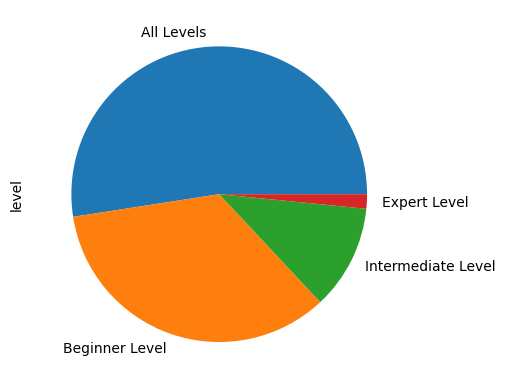

In [5]:
df["level"].value_counts().plot(kind="pie")

In [6]:
time_=pd.to_datetime(df["published_timestamp"])

In [7]:
time_.dt.year
df["year"]=time_.dt.year

In [8]:
df["month"]=time_.dt.month_name()

In [9]:
df["day"]=time_.dt.day_name()

In [10]:
df["quarter"]=time_.dt.quarter

In [11]:
df["profit"]=df["price"] * df["num_subscribers"]

In [12]:
df.set_index(df["published_timestamp"],inplace=True)

In [13]:
df.sample(3)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit
published_timestamp,,,,,,,,,,,,,,,,,
2017-03-03T18:54:28Z,961774,ABC DO VIOLÃO E GUITARRA,https://www.udemy.com/abc-do-violao-e-guitarra/,True,85,25,2,30,Beginner Level,2.5,2017-03-03T18:54:28Z,Musical Instruments,2017,March,Friday,1,2125
2016-11-01T15:30:36Z,992114,"Build A Complete CRUD Application With PHP, MY...",https://www.udemy.com/build-a-complete-crud-ap...,True,20,9762,94,112,All Levels,13.5,2016-11-01T15:30:36Z,Web Development,2016,November,Tuesday,4,195240
2013-02-27T13:05:27Z,42634,"Advanced Options Concepts - Probability, Greek...",https://www.udemy.com/advanced-options-analysis/,True,60,968,81,10,Intermediate Level,2.0,2013-02-27T13:05:27Z,Business Finance,2013,February,Wednesday,1,58080


In [14]:
df["course_id"].nunique()

3672

### drop duplicates :

In [15]:
df.duplicated().value_counts()

False    3672
True        6
dtype: int64

In [16]:
df.drop_duplicates(inplace=True)

In [17]:
df.duplicated().sum()

0

### creat duration categories from content_duration :

In [18]:
df["content_duration"]

published_timestamp
2017-01-18T20:58:58Z     1.5
2017-03-09T16:34:20Z    39.0
2016-12-19T19:26:30Z     2.5
2017-05-30T20:07:24Z     3.0
2016-12-13T14:57:18Z     2.0
                        ... 
2016-06-14T17:36:46Z     2.0
2017-03-10T22:24:30Z     3.5
2015-12-30T16:41:42Z     3.5
2016-08-11T19:06:15Z     3.0
2014-09-28T19:51:11Z     2.0
Name: content_duration, Length: 3672, dtype: float64

### there is tree methods to categorize time durations :

In [19]:
"""Method 1:"""

df["duration_category_"]=pd.cut(df["content_duration"],
                                bins=[0.0,1.,3.,7.,12.,20.,float("inf")],
                                labels=["0-1","1-3","3-7","7-12","12-20","20+"],
                               include_lowest=True,right=False)

In [20]:
""" Method 2: """

category_of_duration=[]
for duration in df["content_duration"]:
    
    if (duration>=0 and duration <1):
        #print(duration)
        category_of_duration.append("0:1")
    elif (duration>=1 and duration <3):
        category_of_duration.append("1:3")
    elif (duration>=3 and duration <7):
        category_of_duration.append("3:7")
    elif (duration>=7 and duration <12):
        category_of_duration.append("7:12")
    elif (duration>=12 and duration <20):
        category_of_duration.append("12:20")
    else :
        category_of_duration.append("20+")
        
df["category_of_duration"]=category_of_duration    
        
        

we can also cut durations using this method:

In [21]:
# check if the time is correctly categrized by method 1:
df[["category_of_duration","content_duration"]].groupby("category_of_duration").min()


,content_duration
category_of_duration,
0:1,0.0
12:20,12.0
1:3,1.0
20+,20.0
3:7,3.0
7:12,7.0


In [22]:
# by method 2
df[["duration_category_","content_duration"]].groupby("duration_category_").min()


,content_duration
duration_category_,
0-1,0.0
1-3,1.0
3-7,3.0
7-12,7.0
12-20,12.0
20+,20.0


In [23]:
# we can see that in duration_category the duration dosn't cuted properly, so lets drop this column:
#df.drop(columns=["duration_category"], inplace =True)
df.sample(10)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit,duration_category_,category_of_duration
published_timestamp,,,,,,,,,,,,,,,,,,,
2015-03-13T18:53:07Z,311638,Joomla 3 : Develop a Professional Website in 3...,https://www.udemy.com/develop-a-professional-h...,True,35,1309,74,43,All Levels,5.0,2015-03-13T18:53:07Z,Web Development,2015,March,Friday,1,45815,3-7,3:7
2016-12-28T20:23:56Z,1052518,Master the Art of Web Design with HTML & CSS,https://www.udemy.com/html-css-beginners/,True,145,550,15,59,All Levels,3.0,2016-12-28T20:23:56Z,Web Development,2016,December,Wednesday,4,79750,3-7,3:7
2014-10-20T10:48:09Z,313484,Laravel 4 try and enjoy php coding,https://www.udemy.com/laravel-4-try-and-enjoy-...,True,20,2402,26,23,Beginner Level,2.0,2014-10-20T10:48:09Z,Web Development,2014,October,Monday,4,48040,1-3,1:3
2014-07-29T21:39:04Z,269638,Codeigniter: How to use Codeigniter that drive...,https://www.udemy.com/codeigniter/,True,150,14606,235,21,All Levels,3.0,2014-07-29T21:39:04Z,Web Development,2014,July,Tuesday,3,2190900,3-7,3:7
2014-12-11T21:14:18Z,364206,Media Training for Financial Service Professio...,https://www.udemy.com/media-training-for-finan...,True,20,1254,2,64,All Levels,7.0,2014-12-11T21:14:18Z,Business Finance,2014,December,Thursday,4,25080,7-12,7:12
2014-05-16T17:02:00Z,214770,Aprende a tocar Música Cristiana en el piano y...,https://www.udemy.com/aprende-a-tocar-musica-c...,True,20,17,3,13,All Levels,1.0,2014-05-16T17:02:00Z,Musical Instruments,2014,May,Friday,2,340,1-3,1:3
2017-03-07T23:10:03Z,1119920,Financial Ratios Using Excel,https://www.udemy.com/financialratios/,True,100,1223,14,29,Beginner Level,1.0,2017-03-07T23:10:03Z,Business Finance,2017,March,Tuesday,1,122300,1-3,1:3
2014-11-14T07:42:47Z,343886,Accounting Standard 3 - An Analysis,https://www.udemy.com/learn-cash-flow-analysis/,True,25,1888,6,11,Intermediate Level,1.0,2014-11-14T07:42:47Z,Business Finance,2014,November,Friday,4,47200,1-3,1:3
2015-01-31T19:02:09Z,382204,Learn How To Successfully Trade Stocks: In 5 S...,https://www.udemy.com/learn-how-to-successfull...,True,95,2493,276,108,All Levels,9.5,2015-01-31T19:02:09Z,Business Finance,2015,January,Saturday,1,236835,7-12,7:12


In [24]:
# drop also duration_category_ column :
df.drop(columns=["duration_category_"], inplace =True)

In [25]:
# creat price categories:
labels=["free","20:50","55:100","105:150","155:200"]
bins=[-float("inf"),0,50,100,150,200]
df["price_category"]=pd.cut(df["price"],bins=bins,labels=labels)

In [26]:
df[df["price"]<20]["price"].value_counts()

0    310
Name: price, dtype: int64

In [27]:
df[df["price"]==0].sample(5)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit,category_of_duration,price_category
published_timestamp,,,,,,,,,,,,,,,,,,,
2017-06-19T23:33:54Z,1246622,Build and Deploy a LAMP server on AWS,https://www.udemy.com/build-and-deploy-a-lamp-...,False,0,3571,18,8,Beginner Level,1.000000,2017-06-19T23:33:54Z,Web Development,2017,June,Monday,2,0,1:3,free
2016-06-08T17:28:16Z,866696,REST WCF Service in ASP.NET,https://www.udemy.com/rest-wcf-service-in-aspnet/,False,0,7905,561,5,All Levels,0.683333,2016-06-08T17:28:16Z,Web Development,2016,June,Wednesday,2,0,0:1,free
2016-06-21T02:49:47Z,839536,Start Making Comics with Manga Studio 5 / Clip...,https://www.udemy.com/start-making-comics/,False,0,5301,125,77,All Levels,6.500000,2016-06-21T02:49:47Z,Graphic Design,2016,June,Tuesday,2,0,3:7,free
2015-08-31T20:52:45Z,590794,Illustrator Quick Tip：10分でKawaiiカメレオンを描こう,https://www.udemy.com/illustrator-quick-tip10k...,False,0,381,24,7,All Levels,0.600000,2015-08-31T20:52:45Z,Graphic Design,2015,August,Monday,3,0,0:1,free
2015-02-07T07:04:07Z,363404,Futures/Commodity Training (Basics),https://www.udemy.com/commodity/,False,0,4863,202,6,Beginner Level,1.500000,2015-02-07T07:04:07Z,Business Finance,2015,February,Saturday,1,0,1:3,free


# Exploratory Data Analysis:

#### univariate analysis
#### bivariate analysis
#### multi-variate analysis

### 1] univariate analysis

In [28]:
### Feature 1 : Subject

In [29]:
#### feature overview (subject)

In [30]:
df["subject"].describe(include='O')

count                3672
unique                  4
top       Web Development
freq                 1199
Name: subject, dtype: object

<AxesSubplot: ylabel='subject'>

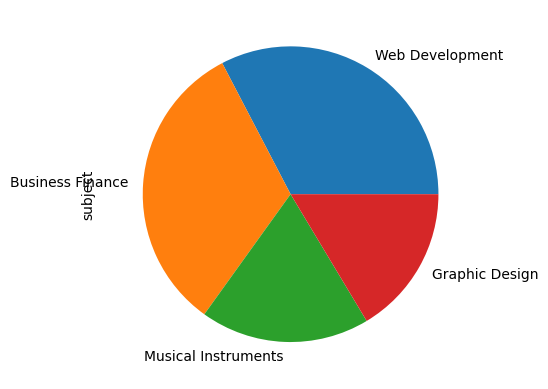

In [31]:
df["subject"].value_counts().plot(kind="pie",)
#plt.update_layout()


## 2] bi-variante analysis

In [32]:
df.sample(2)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit,category_of_duration,price_category
published_timestamp,,,,,,,,,,,,,,,,,,,
2016-02-03T04:10:53Z,682514,Professional Forex strategy,https://www.udemy.com/beginner-trading-forex-s...,True,50,353,21,17,Expert Level,1.5,2016-02-03T04:10:53Z,Business Finance,2016,February,Wednesday,1,17650,1:3,20:50
2015-08-04T19:16:51Z,572744,Trend Traders Club: How To Find And Trade Fast...,https://www.udemy.com/how-to-find-and-trade-pr...,True,75,1513,31,60,All Levels,5.5,2015-08-04T19:16:51Z,Business Finance,2015,August,Tuesday,3,113475,3:7,55:100


#### how meany subcribers in each sublect ?

In [33]:
grb_subject=df[["num_subscribers","subject"]].groupby("subject",as_index=False).sum()
px.bar(grb_subject,x="subject",y="num_subscribers",color="subject")
#plot(kind="bar")    

## what is the total profit for each subject ?

In [34]:
subj_profit=df[["subject","profit"]].groupby("subject",as_index=False).sum()
#px.treemap(subj_profit,names="subject",values="profit")
px.pie(subj_profit,names="subject",values="profit")


### How meany profit in each subject by year ?

In [35]:
df[["year"]].max()

year    2017
dtype: int64

In [36]:

def profit_sub_year(year):
    if year=="All Years":
        subj_profit=df[["subject","profit"]].groupby("subject",as_index=False).sum()
        all_year_fig=px.pie(subj_profit,names="subject",values="profit")
        return all_year_fig
    
    elif (year>=df["year"].min()) and (year<=df["year"].max() ):
        df_year=df[df["year"]==year]
        subj_profit=df_year[["subject","profit"]].groupby("subject",as_index=False).sum()
        year_fig=px.pie(subj_profit,names="subject",values="profit")
        return year_fig
    else :
        return None
    
        


In [37]:
profit_sub_year(2017)

we can also use sunburst or treemap to vizualise all years in the same plot.

In [38]:
fig=px.sunburst(df,names="subject",values="profit",path=["year","subject"],width=700,height=700,)
fig.update_traces(textinfo="label+percent parent")
fig.show()

### In each subject, how meany paid/unpaid courses?

Text(0.5, 1.0, 'Paid vs Unpaid in each subject')

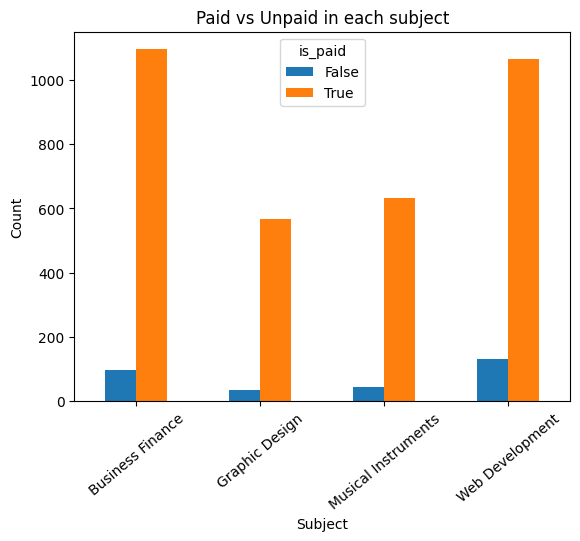

In [39]:
is_paid_grp=df[["subject","is_paid"]].groupby("subject",as_index=False).value_counts()
is_paid_grp
is_paid=pd.pivot_table(data=is_paid_grp,values="count",columns="is_paid",index="subject")
is_paid.plot(kind="bar")
plt.xticks(rotation=40)
plt.xlabel("Subject")
plt.ylabel("Count")
plt.title("Paid vs Unpaid in each subject")

In [40]:
df[["is_paid"]].value_counts()/df.shape[0]*100

is_paid
True       91.557734
False       8.442266
dtype: float64

In [41]:
px.bar(df,x="subject",color="is_paid",opacity=1)

<AxesSubplot: xlabel='subject', ylabel='count'>

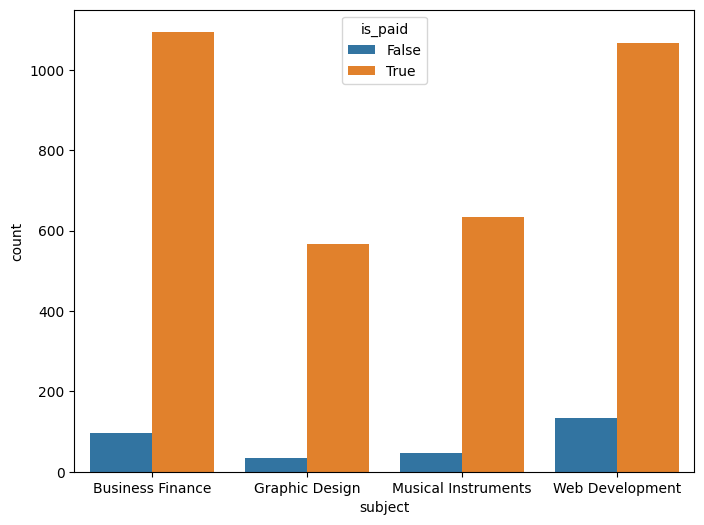

In [42]:
plt.figure(figsize=(8,6))
sns.countplot(df,x="subject",hue="is_paid")

### price category in each subject

<AxesSubplot: xlabel='subject', ylabel='count'>

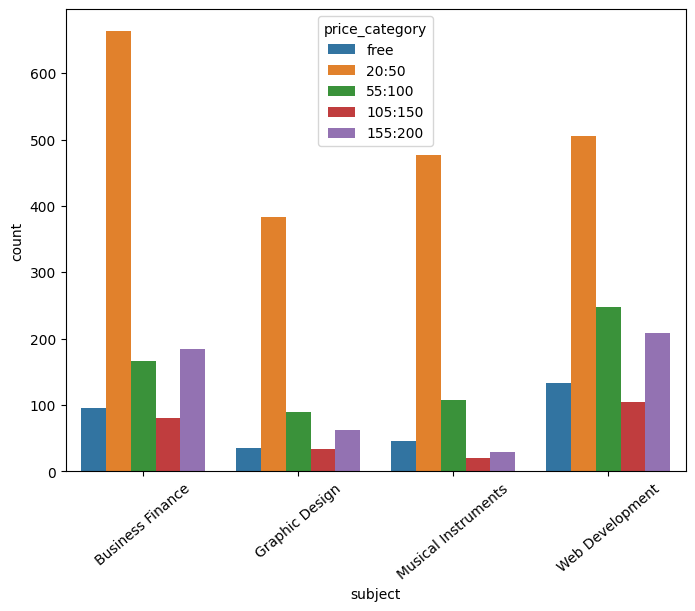

In [43]:
plt.figure(figsize=(8,6))
plt.xticks(rotation=40)
sns.countplot(df,x="subject",hue="price_category")

<AxesSubplot: xlabel='subject', ylabel='count'>

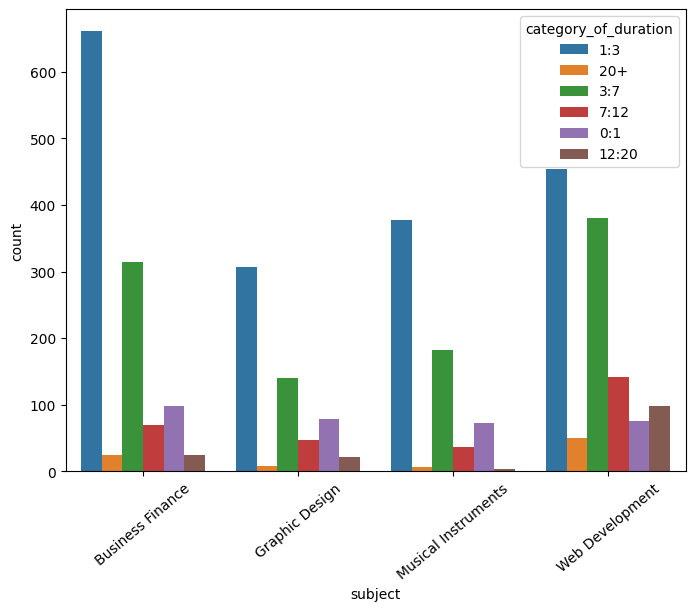

In [44]:
plt.figure(figsize=(8,6))
plt.xticks(rotation=40)
sns.countplot(df,x="subject",hue="category_of_duration",)

In [45]:
df.sample(2)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit,category_of_duration,price_category
published_timestamp,,,,,,,,,,,,,,,,,,,
2013-07-23T10:40:16Z,63712,create 9 professional logo design full version,https://www.udemy.com/create-9-professional-lo...,True,35,91,3,34,All Levels,2.0,2013-07-23T10:40:16Z,Graphic Design,2013,July,Tuesday,3,3185,1:3,20:50
2016-10-18T15:11:13Z,954710,HTML/CSS Bootcamp,https://www.udemy.com/html-css-code-bootcamp/,True,40,194,26,87,Beginner Level,10.0,2016-10-18T15:11:13Z,Web Development,2016,October,Tuesday,4,7760,7:12,20:50


### what is the num of subscribers in each price categorie ?
### regarding price category , what is the number of subscribers in each subject ?

Text(0, 0.5, 'Number of subscribers')

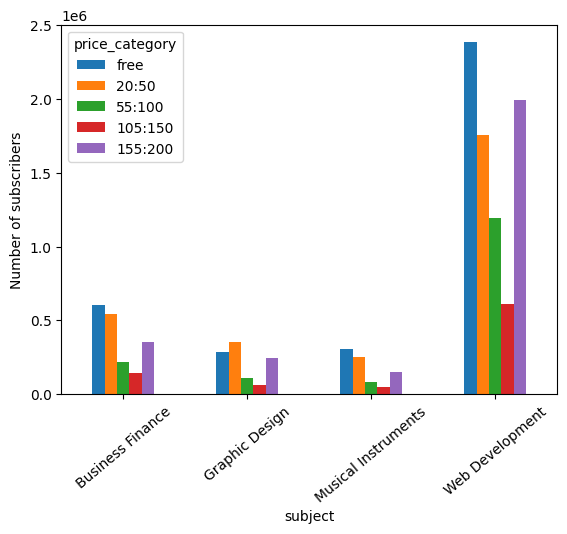

In [46]:
grpby_num_sub=df[["subject","price_category","num_subscribers"]].groupby(["subject","price_category"]).sum()
grpby_num_sub.pivot_table(index="price_category",columns="subject",values="num_subscribers").T.plot(kind="bar")
plt.xticks(rotation=40)

plt.ylabel("Number of subscribers")


<AxesSubplot: xlabel='subject', ylabel='num_subscribers'>

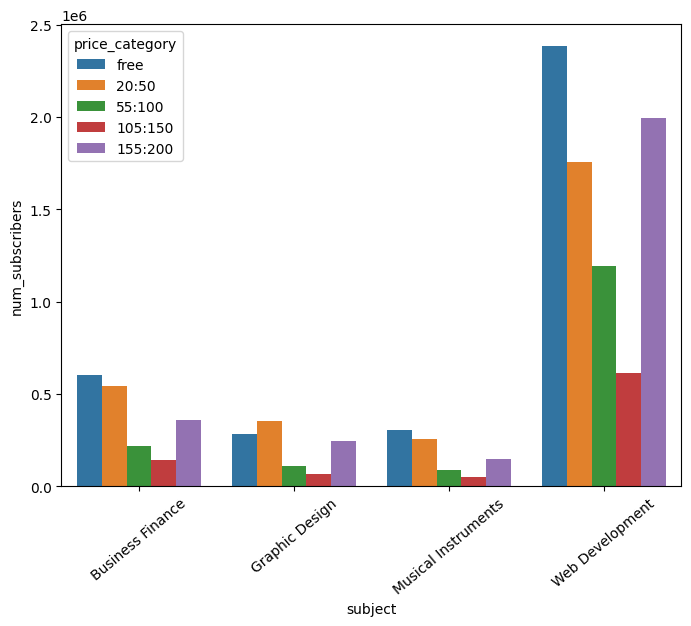

In [47]:
# we can use seaborn too:
plt.figure(figsize=(8,6))
plt.xticks(rotation=40)
sns.barplot(df,x="subject",y="num_subscribers",hue="price_category",estimator='sum',errorbar=None)


### regarding duration category , what is the number of subscribers in each subject ?


C:\Users\hp\AppData\Local\Temp\ipykernel_6716\2376116664.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



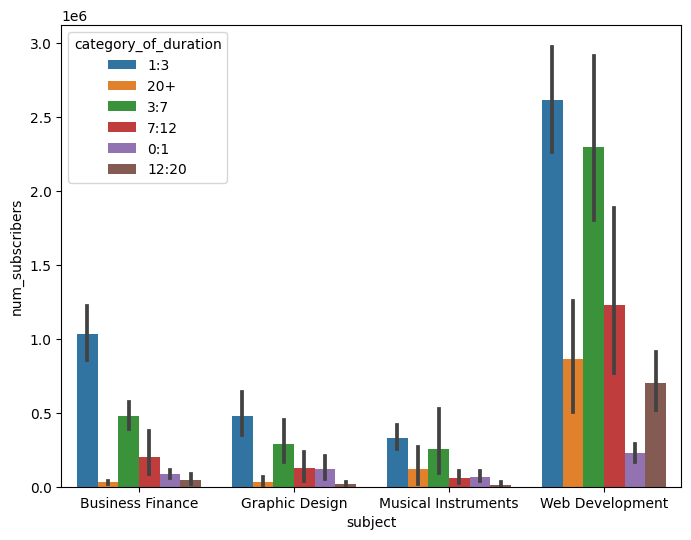

In [48]:
plt.figure(figsize=(8,6))
sns.barplot(df,x="subject",y="num_subscribers",hue="category_of_duration",estimator='sum')
df[["subject","num_subscribers","category_of_duration"]].groupby("subject").sum()
px.treemap(df,names="subject",values="num_subscribers",path=["subject","category_of_duration"])


We can see that from 1:3 duratuion to +20 duration,more the duration increase more the number of subscribers 
decrease.(0:1 is an exeption).

### regarding level, what is the number of subscribers in each subject ?

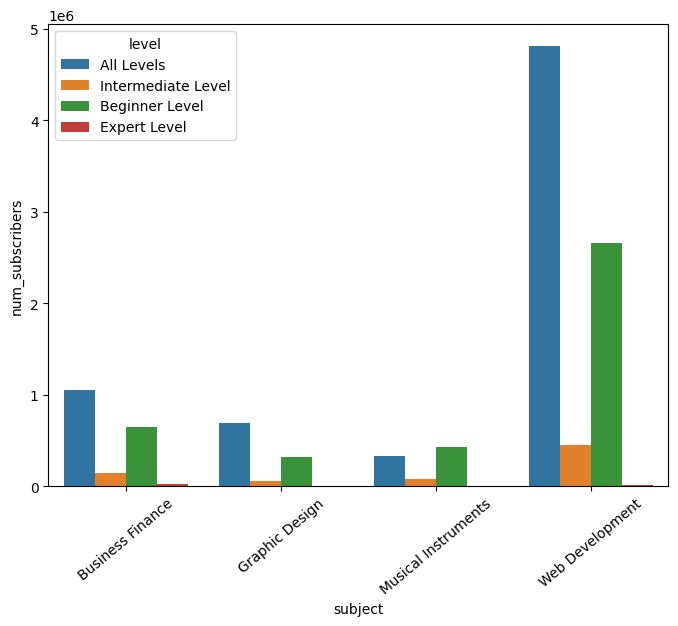

In [49]:
#using seaborn
plt.figure(figsize=(8,6))
plt.xticks(rotation=40)
sns.barplot(df,x="subject",
            y="num_subscribers",
            hue="level",
            estimator="sum",
           errorbar=None)
#using pyplot
px.sunburst(df,names="subject"
            ,values="num_subscribers"
            ,path=["subject","level"],
           height=700,
           width=700)

### regarding level, what is the profit in each subject ?


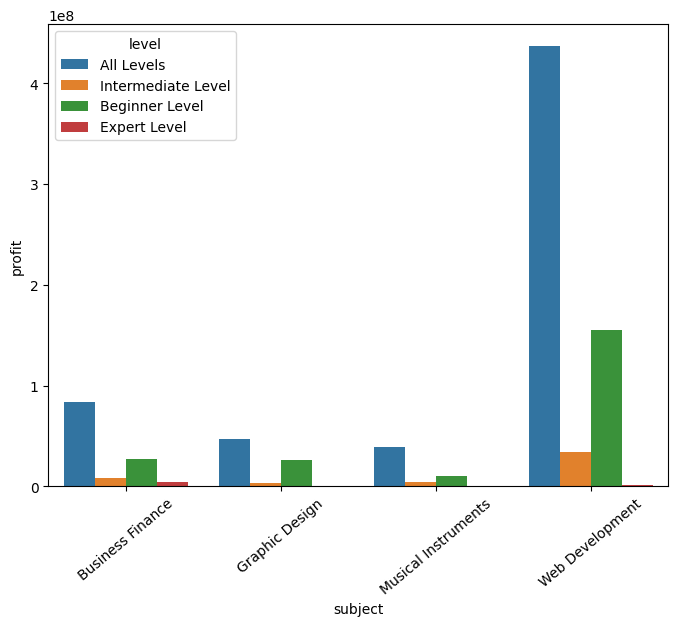

In [50]:
#using seaborn
plt.figure(figsize=(8,6))
plt.xticks(rotation=40)
sns.barplot(df,
            x="subject",
            y="profit",
            hue="level",
            estimator="sum",
           errorbar=None)
#using plotly
px.sunburst(df,
            names="subject",
            values="profit",
            path=["subject","level"],
            height=700,
            width=700,
            title="The profit in each subject regarding levels",
           )

We can see that the "All levels" has the height profit, followed by "Begnner level" 

In [51]:
df.sample(2)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit,category_of_duration,price_category
published_timestamp,,,,,,,,,,,,,,,,,,,
2014-12-31T03:29:21Z,381330,Live Account - ETF Trading System - Hacking Th...,https://www.udemy.com/cracked-wall-street-hack...,True,150,2318,19,16,All Levels,5.0,2014-12-31T03:29:21Z,Business Finance,2014,December,Wednesday,4,347700,3:7,105:150
2017-06-28T23:35:31Z,1254172,Responsive PHP Registration Form: From Scratch,https://www.udemy.com/responsive-php-registrat...,True,95,5738,9,35,All Levels,4.0,2017-06-28T23:35:31Z,Web Development,2017,June,Wednesday,2,545110,3:7,55:100


# Profit\Year

### what is the total profit for all courses ?

In [52]:
print("The total profit for all courses is",df["profit"].sum(),"$")

The total profit for all courses is 881674940 $


# course_title

### what are the most commonly used words in course titles ?

In [53]:
titles=list(df["course_title"])
text=" ".join(i for i in titles)
text

'Ultimate Investment Banking Course Complete GST Course & Certification - Grow Your CA Practice Financial Modeling for Business Analysts and Consultants Beginner to Pro - Financial Analysis in Excel 2017 How To Maximize Your Profits Trading Options Trading Penny Stocks: A Guide for All Levels In 2017 Investing And Trading For Beginners: Mastering Price Charts Trading Stock Chart Patterns For Immediate, Explosive Gains Options Trading 3 : Advanced Stock Profit and Success Method The Only Investment Strategy You Need For Your Retirement Forex Trading Secrets of the Pros With Amazon\'s AWS Trading Options With Money Flow Financial Management Risk and Return For Securities Forex Trading Course: Work Smarter Not Harder Proven Results Python Algo Trading: Sentiment Trading with News Short Selling: Learn To Sell Stocks Before The Fall Basic Technical Analysis: Learn the structure of the market The Complete Chart Pattern Trading Course: A Proven Approach 7 Deadly Mistakes of Investing that Wil

In [54]:
import wordcloud

In [55]:
stopwords=["a","for","in","to","each","How","I","You","an","And","by","In","of","or","your","course","with","on","from","The"]
word=wordcloud.WordCloud(
    stopwords=stopwords,
    random_state=3,
    background_color="black",
    width=800,
    height=400,)

In [56]:
text_words=word.generate(text)
text_words

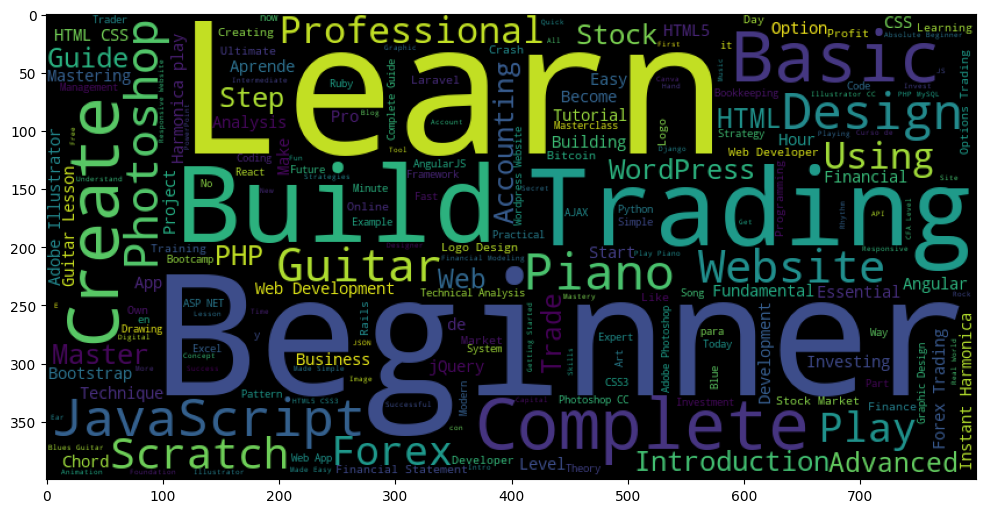

In [57]:
plt.figure(figsize=(12,14))
plt.imshow(text_words)


##### In this word cloud, we can observe the most commonly used words in course titles.

In [58]:
### lets say what are the most commonly used words in course titles in each category :

In [59]:
df[["subject"]].value_counts()

subject            
Web Development        1199
Business Finance       1191
Musical Instruments     680
Graphic Design          602
dtype: int64

In [60]:
def word_cloud(subject):
    df_subject=df[df["subject"]==subject]
    text= "".join(title for title in df_subject["course_title"])
    word=wordcloud.WordCloud(
    stopwords=stopwords,
    random_state=3,
    background_color="black",
    width=800,
    height=400,)
    generated_text=word.generate(text)
    fig=px.imshow(generated_text)
    return fig



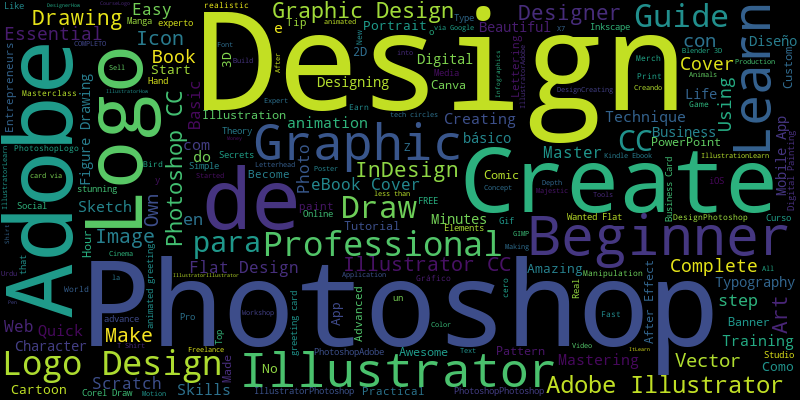

In [61]:
word_cloud("Graphic Design")

### what is the relationship between the number of subscribers and the number of reviews ?

<AxesSubplot: xlabel='num_subscribers', ylabel='num_reviews'>

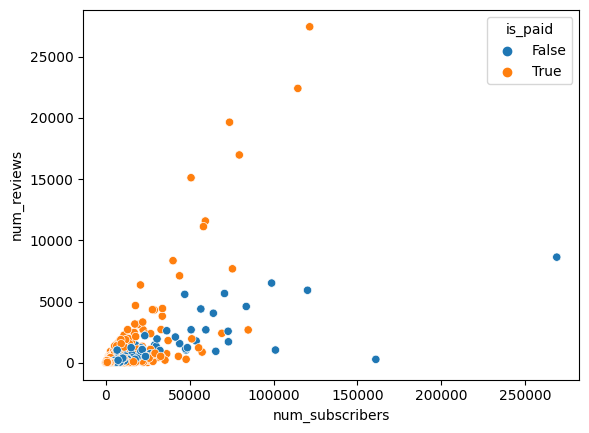

In [62]:
sns.scatterplot(df,x="num_subscribers",y="num_reviews",hue="is_paid")

### what is the relationship between the number of subscribers and the number of lectures ?

<AxesSubplot: xlabel='num_subscribers', ylabel='num_lectures'>

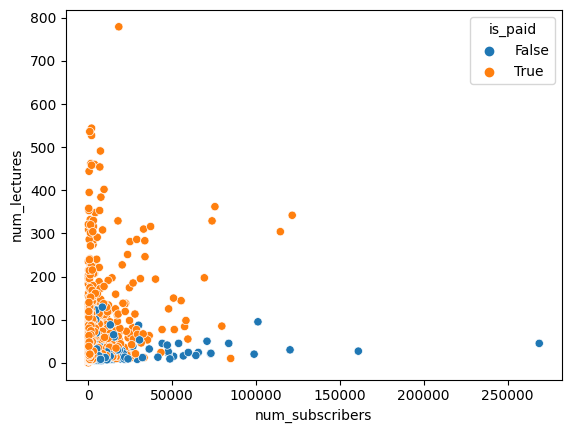

In [63]:
sns.scatterplot(df,x="num_subscribers",y="num_lectures",hue="is_paid")

We can see that number of lectures don't impact number of subscribers.

C:\Users\hp\AppData\Local\Temp\ipykernel_6716\58359773.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<AxesSubplot: >

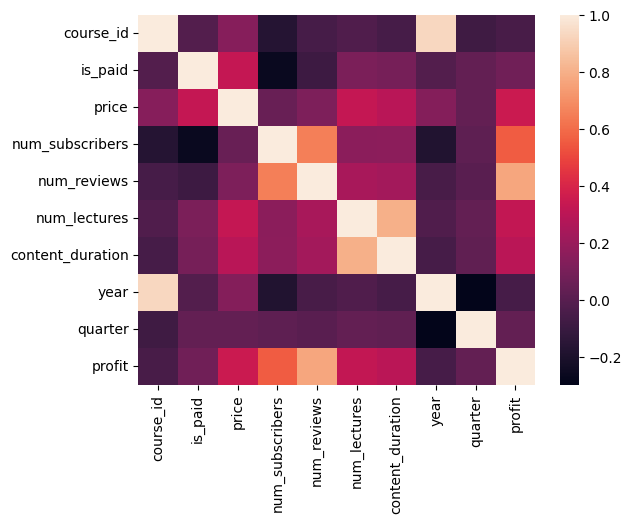

In [64]:
sns.heatmap(df.corr())

In [65]:
df.sample(2)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit,category_of_duration,price_category
published_timestamp,,,,,,,,,,,,,,,,,,,
2016-07-28T02:38:31Z,911712,Wordpress Site Migration,https://www.udemy.com/wordpress-site-migration...,True,20,1894,40,35,All Levels,1.5,2016-07-28T02:38:31Z,Web Development,2016,July,Thursday,3,37880,1:3,20:50
2014-03-16T18:28:46Z,139784,Learn to improvise on your harmonica - in nice...,https://www.udemy.com/benhewlettharmonicatuiti...,True,35,98,1,15,Beginner Level,2.0,2014-03-16T18:28:46Z,Musical Instruments,2014,March,Sunday,1,3430,1:3,20:50


#### number of subs is heigh correlated with  reviwes   

# <center> Time Series Analysis 

###  profit\Years

In [66]:
df.index=pd.to_datetime(df["published_timestamp"])

In [67]:
profit_by_year=df.resample("Y")["profit"].sum()
list(profit_by_year.index.year)

[2011, 2012, 2013, 2014, 2015, 2016, 2017]

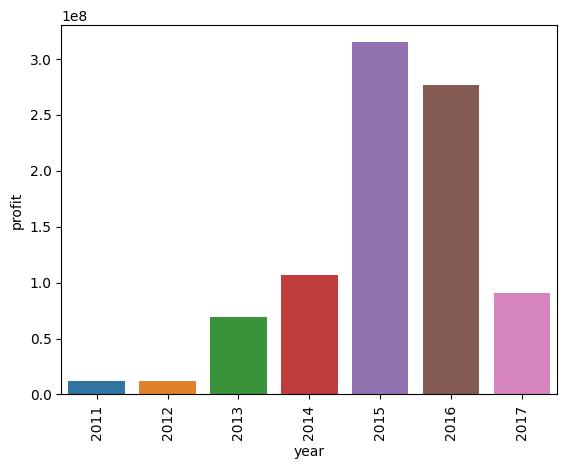

In [68]:
profit_by_year.plot(kind="bar",xlabel="year",ylabel="profit")
sns.barplot(profit_by_year,x=list(profit_by_year.index.year),y=list(profit_by_year.values))
plt.show()
px.scatter(profit_by_year,color=profit_by_year.index.year,size=profit_by_year.values)

### what is the profit in each month and each year ? 

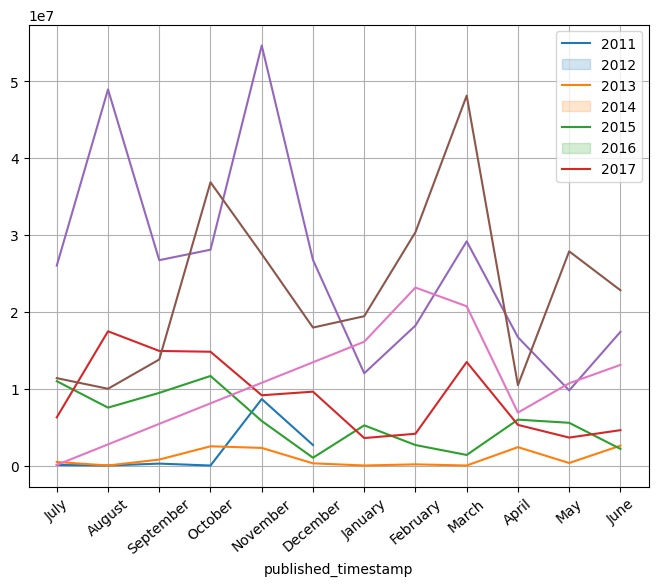

In [69]:
years=["2011","2012","2013","2014","2015","2016","2017"]
plt.figure(figsize=(8,6))
plt.xticks(rotation=40)
for year in years :
    profit_by_year=df.loc[year].resample("M")["profit"].sum()
    sns.lineplot(profit_by_year,x=profit_by_year.index.month_name(),y=profit_by_year.values)
plt.legend(years)
plt.grid()
#profit_by_year=df.resample("M")["profit"].sum()
#profit_by_year.index.month_name()
#profit_by_year.plot(kind="line")
#ax=sns.lineplot(profit_by_year,x=profit_by_year.index.month_name(),y=profit_by_year.values)

In [70]:
years=["2011","2012","2013","2014","2015","2016","2017"]
for year in years :
    profit_by_year=df.loc[year].resample("M")["profit"].sum()
    fig=px.line(profit_by_year,x=profit_by_year.index.month_name(),y=profit_by_year.values)
    fig.show()

<AxesSubplot: xlabel='published_timestamp'>

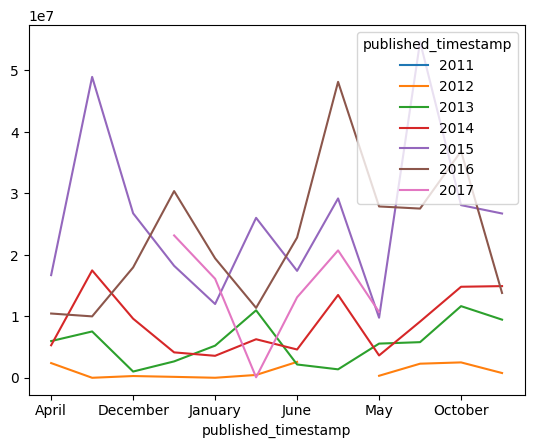

In [71]:
years=["2011","2012","2013","2014","2015","2016","2017"]

# group the data by year and month and sum the profit for each month
profit_by_month = df.groupby([df.index.year, df.index.month_name()])['profit'].sum()
# unstack the data to create a DataFrame with each year's profit as a separate column
profit_by_month = profit_by_month.unstack(level=0)
profit_by_month.reset_index( inplace= False)
#profit_by_month.index

profit_by_month.plot(kind="line")
#plt.figure(figsize=(10,8))
#plt.xticks(rotation=40)

# plot each year's profit as a separate line on the same plot
#sns.lineplot(data=profit_by_month, y="published_timestamp")

#plt.legend(years)
#plt.grid()

### what is the profit by year for each subject ?

In [72]:
px.sunburst(df,names="subject",values="profit",path=["year","subject"],height=700,width=700)

### what is the profit by year for each subject and each duration category ?

In [73]:
px.treemap(df,
           names="category_of_duration"
           ,values="profit",
           path=["year","subject","category_of_duration"]
           ,height=800,
           width=1000)

* Udemy profit has a huge decrease 2017, 
* the most profitable subject is Web dev
* regarding years,the most profitable durations are : 1:3 and 3:7, (+20 was the best in 2015 and 2016) 


In [74]:
df.sample(5)

,course_id,course_title,url,is_paid,price,num_subscribers,num_reviews,num_lectures,level,content_duration,published_timestamp,subject,year,month,day,quarter,profit,category_of_duration,price_category
published_timestamp,,,,,,,,,,,,,,,,,,,
2016-01-22 21:24:38+00:00,738198,Make flat design trees in Adobe Illustrator in...,https://www.udemy.com/make-flat-design-trees-i...,True,50,2087,95,6,Beginner Level,0.633333,2016-01-22T21:24:38Z,Graphic Design,2016,January,Friday,1,104350,0:1,20:50
2015-08-19 01:06:26+00:00,513846,７日でマスター ビギナー向け Adobe Illustrator どきどきセミナー,https://www.udemy.com/7-adobe-illustrator/,True,20,108,3,44,Beginner Level,5.500000,2015-08-19T01:06:26Z,Graphic Design,2015,August,Wednesday,3,2160,3:7,20:50
2014-09-14 21:13:26+00:00,283780,Build a DCF Model from Scratch,https://www.udemy.com/build-a-dcf-model/,False,0,4653,395,5,All Levels,0.516667,2014-09-14T21:13:26Z,Business Finance,2014,September,Sunday,3,0,0:1,free
2017-03-15 16:46:00+00:00,1134692,Learn Inkscape : Design Logos and Game Arts,https://www.udemy.com/design-logos-and-game-ar...,True,20,1675,20,12,Beginner Level,1.000000,2017-03-15T16:46:00Z,Graphic Design,2017,March,Wednesday,1,33500,1:3,20:50
2016-04-18 15:23:27+00:00,821526,How To Make A Business Website In 1 Day With W...,https://www.udemy.com/how-i-make-a-professiona...,True,20,3759,24,25,Beginner Level,4.000000,2016-04-18T15:23:27Z,Web Development,2016,April,Monday,2,75180,3:7,20:50


### Profit by Quarter:

In [75]:
profit_quarter=df[["profit","quarter"]].groupby(["quarter"],as_index=False).sum()
profit_quarter["quarter"]=profit_quarter["quarter"].astype("str")
px.bar(profit_quarter,x="quarter",y="profit",color="quarter")

<AxesSubplot: xlabel='year', ylabel='profit'>

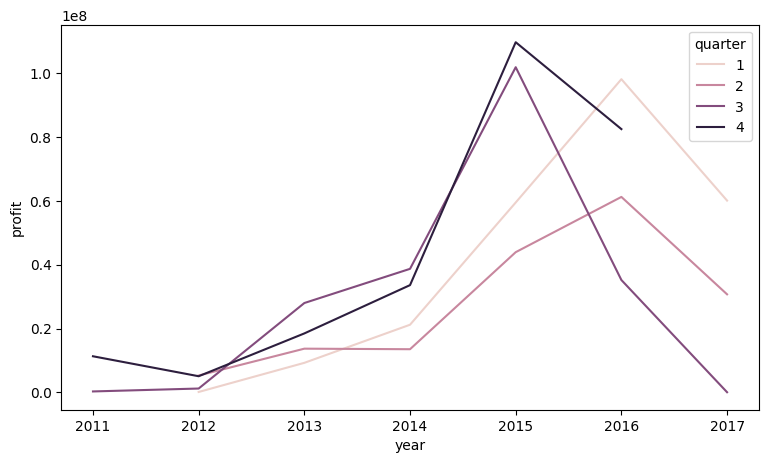

In [76]:
plt.figure(figsize=(9,5))
sns.lineplot(df,x="year",y="profit",hue="quarter",estimator="sum",errorbar=None)

In [77]:
px.treemap(df,names="quarter",values="profit",path=["year","quarter"],title="profit by quarter in each year")

#### the quarters with the hightest profit are quarter 1 and 4

### What is the profit in each month ? what is the monthe with the hight profit in each month ?

<AxesSubplot: xlabel='year', ylabel='profit'>

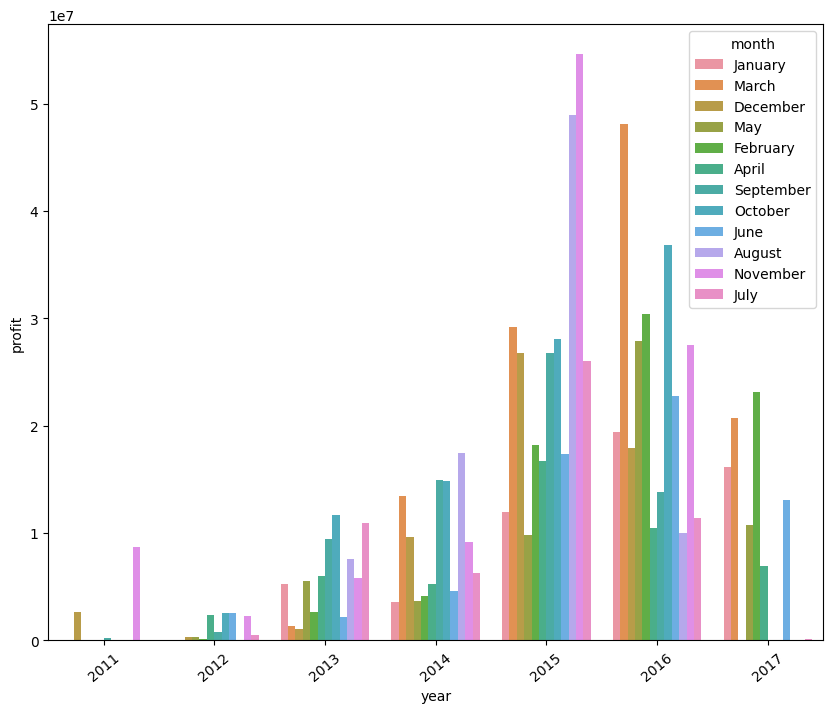

In [78]:
plt.figure(figsize=(10,8))
plt.xticks(rotation=40)
sns.barplot(df,x="year",y="profit",hue="month",estimator='sum',errorbar=None)

In [79]:
px.sunburst(df,names="month",values="profit",path=["year","month"],width=700,height=700)


In [132]:
month_year_df=df[["num_subscribers","profit","year","month"]].groupby(["month","year"],as_index=False).sum()
#month_year_df=pd.pivot_table(month_year_df,columns="month",index="year",values="profit")
month_year_df
#april_profit=month_year_df["April"]
#px.line(month_year_df,x="year",y="month")

,month,year,num_subscribers,profit
0,April,2012,64127,2393230
1,April,2013,168294,5972705
2,April,2014,268733,5289545
3,April,2015,313406,16701795
4,April,2016,170084,10456155
...,...,...,...,...
65,September,2012,17742,774270
66,September,2013,161209,9458170
67,September,2014,174969,14915425
68,September,2015,290778,26729945


In [135]:
px.scatter(month_year_df,
           x="year",
           y="profit",
           color="num_subscribers",
           size_max=60,
           size="profit",
           animation_frame="month",
           title="Total profit vs number of subscribers in each month and each year "
          )
#sns.scatterplot(month_year_df,x="year",y="profit",hue="month")

<AxesSubplot: xlabel='month', ylabel='profit'>

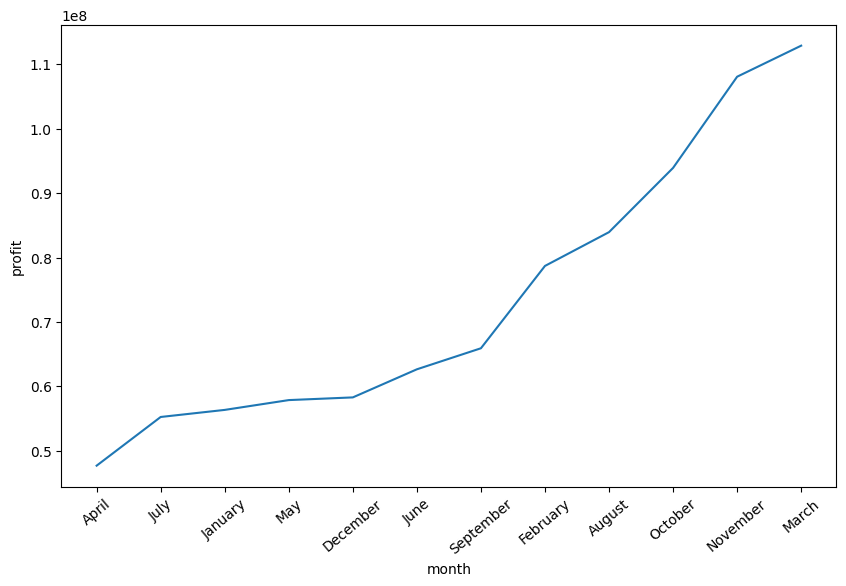

In [82]:
profit_by_month=df[["profit","month"]].groupby("month",as_index=False).sum().sort_values(by="profit")
plt.figure(figsize=(10,6))
plt.xticks(rotation=40)
sns.lineplot(profit_by_month,x="month",y="profit")

#### the most frofitable months are *March* and *November*

In [81]:
df.to_csv("Udemy_courses.csv")

In [ ]:
# Generate a report for the DataFrame
report = ydata_profiling.ProfileReport(df)

# Save the report as an HTML file
report.to_file('report.html')

In [ ]:
report